## Fastai tabular

In [ ]:
# !pip install nvidia-smi

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
# pip install torch==2.0.1+cu118 torchvision==2.0.1+cu118 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
import torch
torch.__version__

'2.5.0+cu121'

In [ ]:
# !pip install fastai

In [ ]:
import fastai
fastai.__version__

'2.7.18'

In [ ]:
# !pip install numpy==1.24

In [ ]:
# !pip install --upgrade fastai matplotlib

In [ ]:
# !conda update --all -y

In [ ]:
from fastai.tabular.all import *

### Bu verilənlər bazasının nümunəsini adətən istifadə edilən untar_data əmrini ilə yükləyə bilərik.

### Data yuklenir

In [ ]:
# 'untar_data' funksiyası ilə verilənlər bazasını yükləyir və çıxarır.
# URLs.ADULT_SAMPLE, Fastai tərəfindən verilənlər bazasının URL adresini təmsil edir.
path = untar_data(URLs.ADULT_SAMPLE)  # Verilənlər bazası yüklənir və çıxarılır

# 'path.ls()' funksiyası ilə verilənlər bazası qovluğundakı faylların siyahısını əldə edirik.
# Bu, verilənlər bazasının içində hansı faylların olduğunu göstərir.
path.ls()  # Yüklənmiş verilənlər bazasındakı faylları göstərir

(#3) [Path('/root/.fastai/data/adult_sample/export.pkl'),Path('/root/.fastai/data/adult_sample/models'),Path('/root/.fastai/data/adult_sample/adult.csv')]

In [ ]:
df = pd.read_csv(path/'adult.csv')
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,49,Private,101320,Assoc-acdm,12.0,Married-civ-spouse,NaN,Wife,White,Female,0,1902,40,United-States,>=50k
1,44,Private,236746,Masters,14.0,Divorced,Exec-managerial,Not-in-family,White,Male,10520,0,45,United-States,>=50k
2,38,Private,96185,HS-grad,NaN,Divorced,NaN,Unmarried,Black,Female,0,0,32,United-States,<50k
3,38,Self-emp-inc,112847,Prof-school,15.0,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,United-States,>=50k
4,42,Self-emp-not-inc,82297,7th-8th,NaN,Married-civ-spouse,Other-service,Wife,Black,Female,0,0,50,United-States,<50k


In [ ]:
df.columns=df.columns.str.replace('-', "_", regex=True)

Some of the columns are continuous (like age) and we will treat them as float numbers we can feed our model directly. Others are categorical (like workclass or education) and we will convert them to a unique index that we will feed to embedding layers. We can specify our categorical and continuous column names, as well as the name of the dependent variable in TabularDataLoaders factory methods

### Data Preparation

In [ ]:
# TabularDataLoaders sinifindən .from_csv metodunu istifadə edərək CSV faylından məlumat yükləyir və təlim üçün hazırlayır.
dls = TabularDataLoaders.from_df(
#     # path/'adult.csv' faylının yolunu göstərir, məlumatları bu fayldan oxuyacaq.
#     path/'adult.csv',
#     # Məlumatın saxlanılacağı əsas qovluğu təyin edir (bu qovluq daha sonra model üçün faydalı ola bilər).
    df,
    path=path,
    # Hədəf dəyişəni olaraq "salary" sütununu təyin edir (bu, təlim zamanı modelin öyrənməyə çalışdığı məqsəd sütunudur).
    y_names="salary",
    # Hər batch üçün 25 nümunə götürür (bu, təlim zamanı yaddaş və sürət optimallaşdırması üçündür).
    bs=25,
    # Kateqorial dəyişənlərin adlarını təyin edir; model bu sütunları kateqorial dəyişən kimi istifadə edəcək.
    cat_names = ['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race',
                                                                                     'sex', 'native_country'],
    # Davamlı dəyişənlərin adlarını təyin edir; bu sütunlar sayısal məlumatlar kimi istifadə olunacaq.
    cont_names = ['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss', 'hours_per_week'],
    # Məlumatı əvvəlcədən emal edən əməliyyatların siyahısını təyin edir:
    # Categorify kateqorial dəyişənləri kateqoriya olaraq kodlayır,
    # FillMissing boş dəyərləri doldurur,
    # Normalize isə davamlı dəyişənləri normallaşdırır.
    procs=[Categorify, FillMissing, Normalize],
    valid_pct=0.2
)

/usr/local/lib/python3.10/dist-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  to[n].fillna(self.na_dict[n], inplace=True)


### One Batch Show

In [ ]:
# dls obyektindəki məlumatlardan bir batch (toplu) nümunə göstərir.
# Bu nümunə modelin təlim zamanı görəcəyi məlumatların kiçik bir hissəsini əyani şəkildə nümayiş etdirir.
dls.show_batch()

,workclass,education,marital_status,occupation,relationship,race,sex,native_country,education_num_na,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,salary
0,Private,Bachelors,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,Taiwan,False,28.000000,168901.000368,13.0,0.000001,0.000003,40.0,<50k
1,Private,Assoc-voc,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,False,36.000000,272944.000243,11.0,0.000001,0.000003,60.0,>=50k
2,Private,HS-grad,Divorced,Other-service,Not-in-family,White,Female,United-States,False,53.000001,139127.000708,9.0,0.000001,0.000003,40.0,<50k
3,Private,Some-college,Never-married,Protective-serv,Own-child,White,Male,Mexico,False,23.000001,219835.000000,10.0,0.000001,0.000003,40.0,<50k
4,Private,Bachelors,Never-married,Prof-specialty,Own-child,White,Female,United-States,False,34.000000,188798.000015,13.0,0.000001,0.000003,40.0,<50k
5,Private,Bachelors,Never-married,Exec-managerial,Not-in-family,White,Male,United-States,False,34.000000,176184.999634,13.0,0.000001,1741.000067,40.0,<50k
6,Private,Bachelors,Married-civ-spouse,Craft-repair,Husband,Asian-Pac-Islander,Male,United-States,False,52.000000,145270.999838,13.0,0.000001,0.000003,40.0,<50k
7,Private,HS-grad,Never-married,Craft-repair,Not-in-family,White,Male,United-States,False,35.000000,285020.001143,9.0,0.000001,0.000003,40.0,<50k
8,Self-emp-not-inc,Assoc-acdm,Married-civ-spouse,Other-service,Husband,White,Male,Iran,False,57.000000,138284.999125,12.0,0.000001,0.000003,40.0,<50k
9,Self-emp-not-inc,Bachelors,Married-civ-spouse,Sales,Husband,White,Male,United-States,False,58.999999,174056.000571,13.0,15024.000315,0.000003,40.0,>=50k


In [ ]:
# 'education' sütunundakı unikal (təkrarsız) dəyərlərin sayını hesablayır və qaytarır.
len(df.education.unique())

16

### Tabular_learner metodundan istifadə edərək modeli müəyyən edə bilərik. Modelimizi müəyyən etdiyimiz zaman fastai əvvəlki y_names əsasında itki funksiyasını çıxarmağa çalışacaq.

### Creat Model

In [ ]:
# 'tabular_learner' funksiyası ilə tabular məlumatlar üzərində bir model qurur.
# Modelin parametrləri:
# - 'dls': modelin istifadə edəcəyi verilənlər dəstini təmin edir.
# - 'metrics=[accuracy]': modeli qiymətləndirmək üçün dəqiqlik (accuracy) metrikasını təyin edir.
# - 'layers=[50,10]': modelin sinir şəbəkəsindəki gizli qatların ölçülərini göstərir (50 və 10 neyronlu iki gizli qat).
# Bu parametrlər modelin quruluşunu və təlim prosesini təyin edir.
learn = tabular_learner(dls, metrics=[accuracy], layers=[200,100])

### Save Model

In [ ]:
# 'learn.save' funksiyası ilə qurulan modeli 'model.pkl' adlı fayla saxlayır.
# Bu sayədə modeli sonradan yükləyərək təkrar istifadə etmək mümkündür,
# beləliklə modeli hər dəfə yenidən öyrətməyə ehtiyac qalmır.
# learn.save('model.pkl')

### Model Structure

In [ ]:
# 'learn.summary()' funksiyası modelin strukturunu ətraflı şəkildə göstərir.
# Bu, modelin qatlarının (layers), parametrlərinin və digər mühüm xüsusiyyətlərinin
# nəzərdən keçirilməsinə imkan verir, beləliklə modelin necə qurulduğunu anlamağa kömək edir.
learn.summary()

TabularModel (Input shape: 25 x 9)
Layer (type)         Output Shape         Param #    Trainable 
                     25 x 6              
Embedding                                 60         True      
____________________________________________________________________________
                     25 x 8              
Embedding                                 136        True      
____________________________________________________________________________
                     25 x 5              
Embedding                                 40         True      
____________________________________________________________________________
                     25 x 8              
Embedding                                 128        True      
____________________________________________________________________________
                     25 x 5              
Embedding                                 35         True      
_______________________________________________________________

### Modeli fit_one_cycle metodu ilə öyretmek

### Train Stage

In [ ]:
# 'learn.fit_one_cycle(5)' funksiyası modelin təlimini 5 epox üçün həyata keçirir.
# Bu funksiya, "One Cycle" təlim qaydasını tətbiq edərək optimallaşdırma üçün ən yaxşı
# öyrənmə dərəcəsini tapmağa çalışır. Burada 'max_lr=5e-3' maksimum öyrənmə dərəcəsini
# və 'wd=0.1' isə weight decay (çəkilərin cəzalandırılması) dəyərini təyin edir.

# learn.fit_one_cycle(5, lr_max=5e-3, wd=0.1)
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,accuracy,time
0,0.352255,0.333685,0.846744,00:30
1,0.347103,0.317986,0.858722,00:12
2,0.331141,0.324657,0.851351,00:12
3,0.328732,0.323722,0.851505,00:12
4,0.328692,0.323160,0.853348,00:12


In [ ]:
# Təlimin statistikalarını və metriklərini göstərir
learn.recorder.values

[(#3) [0.35225531458854675,0.3336850106716156,0.8467444777488708],
 (#3) [0.34710338711738586,0.3179857134819031,0.8587223291397095],
 (#3) [0.3311413824558258,0.32465660572052,0.8513513803482056],
 (#3) [0.32873231172561646,0.32372215390205383,0.851504921913147],
 (#3) [0.3286924362182617,0.32316040992736816,0.853347659111023]]

### Show_results

In [ ]:
learn.show_results()

,workclass,education,marital_status,occupation,relationship,race,sex,native_country,education_num_na,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week,salary,salary_pred
0,5.0,13.0,3.0,11.0,1.0,5.0,2.0,1.0,2.0,1.203823,-0.870289,-0.030763,1.930938,-0.216585,0.766128,1.0,1.0
1,5.0,16.0,3.0,13.0,3.0,5.0,2.0,40.0,1.0,0.106877,0.335360,-0.030763,-0.146191,-0.216585,-0.038558,0.0,0.0
2,5.0,1.0,4.0,4.0,2.0,5.0,1.0,40.0,1.0,0.180007,0.127388,-1.603559,-0.146191,-0.216585,-0.038558,0.0,0.0
3,2.0,11.0,3.0,0.0,1.0,5.0,2.0,40.0,2.0,0.618786,-0.828190,-0.030763,-0.146191,-0.216585,-0.038558,1.0,1.0
4,5.0,16.0,3.0,13.0,1.0,5.0,2.0,40.0,1.0,-1.136328,-1.214742,-0.030763,-0.146191,-0.216585,0.363785,0.0,0.0
5,5.0,9.0,6.0,13.0,2.0,3.0,2.0,40.0,1.0,0.106877,1.764503,0.362436,-0.146191,-0.216585,0.283316,0.0,0.0
6,5.0,12.0,5.0,8.0,4.0,5.0,2.0,40.0,1.0,-1.063198,-0.832467,-0.423962,-0.146191,-0.216585,-0.038558,0.0,0.0
7,2.0,12.0,5.0,2.0,2.0,5.0,2.0,40.0,1.0,-0.258771,0.533099,-0.423962,-0.146191,-0.216585,-0.038558,0.0,0.0
8,5.0,5.0,3.0,4.0,1.0,5.0,2.0,40.0,1.0,-0.112512,0.358939,-2.783157,-0.146191,-0.216585,-0.038558,0.0,0.0


### Test Stage

In [ ]:
# 'df' DataFrame-nin bir nüsxəsini yaradır və onu 'test_df' adlı yeni bir dəyişəndə saxlayır.
test_df = df.copy()

# 'salary' sütununu 'test_df' DataFrame-indən silir. 'axis=1' sütunu, 'inplace=True' isə dəyişikliklərin birbaşa
                                                                            # DataFrame-də aparılmasını təmin edir.
# test_df.drop(['salary'], axis=1, inplace=True)

# Əvvəllər təlim üçün istifadə olunan 'learn' obyektindən (model) test verilənlər dəstini yükləmək üçün 'dl' adlı
                                                                            # test verilənlər dəsti yaradır.
dl = learn.dls.test_dl(test_df)

/usr/local/lib/python3.10/dist-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  to[n].fillna(self.na_dict[n], inplace=True)


### Predicts

In [ ]:
# 'dl' adlı test verilənlər dəsti üzərində modelin proqnozlarını alır.
# 'learn.get_preds(dl=dl)' funksiyası verilənlər dəstindəki hər nümunə üçün modelin
                                                                            # proqnozlaşdırdığı nəticələri qaytarır.
# Bu funksiya iki nəticə qaytarır: proqnoz dəyərləri və (əgər varsa) etiket dəyərləri.
learn.get_preds(dl=dl)

(tensor([[0.1708, 0.8292],
         [0.3583, 0.6417],
         [0.9851, 0.0149],
         ...,
         [0.6940, 0.3060],
         [0.7232, 0.2768],
         [0.7260, 0.2740]]),
 tensor([[1],
         [1],
         [0],
         ...,
         [1],
         [0],
         [0]], dtype=torch.int8))

### Metrics

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score,\
                                                                                                confusion_matrix

# Proqnozları və həqiqi etiketləri əldə edirik
preds, labels = learn.get_preds(dl=dl)

# Proqnozları 0 və 1 formatında qəbul edirik
binary_preds = (preds[:, 1] > 0.5).long()

# Accuracy hesablayırıq
accuracy = accuracy_score(labels, binary_preds)

# Precision, Recall, F1 Score və Confusion Matrix hesablayırıq
precision = precision_score(labels, binary_preds)
recall = recall_score(labels, binary_preds)
f1 = f1_score(labels, binary_preds)
conf_matrix = confusion_matrix(labels, binary_preds)

# Classification Report əldə edirik
class_report = classification_report(labels, binary_preds)

# Nəticələri çap edirik
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")

Accuracy: 0.8502502994379779
Precision: 0.7585906157334729
Recall: 0.5546486417548782
F1 Score: 0.6407838514807721
Confusion Matrix:
[[23336  1384]
 [ 3492  4349]]
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     24720
           1       0.76      0.55      0.64      7841

    accuracy                           0.85     32561
   macro avg       0.81      0.75      0.77     32561
weighted avg       0.84      0.85      0.84     32561



### Predict Probability DataFrame formasinda

In [ ]:
# Proqnozları əldə edir
preds, _ = learn.get_preds(dl=dl)

# Proqnozları orijinal test_df DataFrame-in axırına yeni bir sütun kimi əlavə edir
test_df['Prediction'] = preds.numpy()[:, 1]  # Prediction nəticəsini sütun olaraq əlavə edir

# Nəticənin ilk 5 sətrini göstərir
test_df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,salary,Prediction
0,49,Private,101320,Assoc-acdm,12.0,Married-civ-spouse,NaN,Wife,White,Female,0,1902,40,United-States,>=50k,0.829162
1,44,Private,236746,Masters,14.0,Divorced,Exec-managerial,Not-in-family,White,Male,10520,0,45,United-States,>=50k,0.641651
2,38,Private,96185,HS-grad,NaN,Divorced,NaN,Unmarried,Black,Female,0,0,32,United-States,<50k,0.014871
3,38,Self-emp-inc,112847,Prof-school,15.0,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,United-States,>=50k,0.786371
4,42,Self-emp-not-inc,82297,7th-8th,NaN,Married-civ-spouse,Other-service,Wife,Black,Female,0,0,50,United-States,<50k,0.165489


### Predict Binary DataFrame formasinda

In [ ]:
# Proqnozları əldə edir
preds, _ = learn.get_preds(dl=dl)

# Proqnozları 0 və 1-ə çevirmək üçün yuvarlayırıq
binary_preds = (preds.numpy()[:, 1] > 0.5).astype(int)  # 0.5 sərhədindən yuxarı dəyərlər 1, aşağısı isə 0 olur

# Bu proqnozları orijinal test_df DataFrame-in axırına yeni sütun kimi əlavə edir
test_df['Prediction'] = binary_preds

# Nəticənin ilk 5 sətrini göstərir
test_df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,salary,Prediction
0,49,Private,101320,Assoc-acdm,12.0,Married-civ-spouse,NaN,Wife,White,Female,0,1902,40,United-States,>=50k,1
1,44,Private,236746,Masters,14.0,Divorced,Exec-managerial,Not-in-family,White,Male,10520,0,45,United-States,>=50k,1
2,38,Private,96185,HS-grad,NaN,Divorced,NaN,Unmarried,Black,Female,0,0,32,United-States,<50k,0
3,38,Self-emp-inc,112847,Prof-school,15.0,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,United-States,>=50k,1
4,42,Self-emp-not-inc,82297,7th-8th,NaN,Married-civ-spouse,Other-service,Wife,Black,Female,0,0,50,United-States,<50k,0


### Forecats

In [ ]:
import copy
Pred_df = copy.deepcopy(df.iloc[[0]])
Pred_df

# İlk sətri test kimi istifadə etmək üçün yeni bir DataLoader yaradılır
Pred_dl = learn.dls.test_dl(Pred_df)

# Proqnozları əldə edir
preds, _ = learn.get_preds(dl=Pred_dl)

# Proqnozları 0 və 1-ə çevirmək üçün yuvarlayırıq
binary_preds = (preds.numpy()[:, 1] > 0.5).astype(int)  # 0.5 sərhədindən yuxarı dəyərlər 1, aşağısı isə 0 olur

# Bu proqnozları orijinal test_df DataFrame-in axırına yeni sütun kimi əlavə edir
Pred_df.loc[:, 'Prediction'] = binary_preds

# Nəticənin ilk 5 sətrini göstərir
Pred_df

/usr/local/lib/python3.10/dist-packages/fastai/tabular/core.py:314: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  to[n].fillna(self.na_dict[n], inplace=True)


,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,salary,Prediction
0,49,Private,101320,Assoc-acdm,12.0,Married-civ-spouse,NaN,Wife,White,Female,0,1902,40,United-States,>=50k,1


# Fastai Vision
## Single-label classification

In [ ]:
from fastai.vision.all import *


The dataset can be downloaded and decompressed with this line of code:

### Data yuklenir

In [ ]:
# Ev heyvanları verilənlər bazasını internetdən yükləyir və çıxarır, saxlanılan qovluğun yolunu
                                                                                    # `path` dəyişənində saxlayır
path = untar_data(URLs.PETS)

In [ ]:
# `path` qovluğunun içindəki faylları və qovluqları siyahı şəklində göstərir
path.ls()

(#2) [Path('/root/.fastai/data/oxford-iiit-pet/images'),Path('/root/.fastai/data/oxford-iiit-pet/annotations')]

In [ ]:
# `path` qovluğundakı "images" adlı alt qovluqda olan bütün şəkil fayllarını tapır və onları 'files' adlı siyahıda saxlayır.
files = get_image_files(path/"images")

# Fayl siyahısındakı (images qovluğunda olan şəkillərin) ümumi sayını göstərir.
len(files)

7390

In [ ]:
# `files[0]` və `files[6]` dəyişənləri "images" qovluğundakı ilk və yeddinci şəkil faylını göstərir.
# Bu kod ilk şəkil faylını (files[0]) və yeddinci şəkil faylını (files[6]) sırasıyla ekrana yazdıracaq.
files[0], files[6]


(Path('/root/.fastai/data/oxford-iiit-pet/images/saint_bernard_46.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_16.jpg'))

### Bu datasetde pisikler boyuk herle yazilib

In [ ]:
# `label_func(f)` funksiyası, verilən fayl adı `f`-nin ilk hərfini yoxlayır.
# Əgər fayl adının ilk hərfi böyük hərfdirsə (`isupper()` funksiyası ilə yoxlanılır),
# funksiya `True` qaytarır, əks halda isə `False` qaytarır.
def is_cat(filename): return filename[0].isupper()

### Data Preparation

In [ ]:
# Şəkil məlumatlarını yükləmək və modellə təlim üçün hazırlamaq üçün `ImageDataLoaders` obyektini yaradır.
dls = ImageDataLoaders.from_name_func(
    # Yükləmə üçün şəkil məlumatlarının saxlandığı əsas qovluğun yolunu göstərir.
    path,
    # Şəkil fayllarının siyahısını təyin edir.
    files,
    # Hər bir şəkil üçün sinif etiketini müəyyənləşdirən bir funksiya təyin edir.
    label_func=is_cat,
    # Şəkillərin modelə uyğun boyutlandırılması üçün təsvirləri 224x224 ölçüsünə çevirir.
    item_tfms=Resize(224),
    valid_pct=0.2,
    seed=42,
)

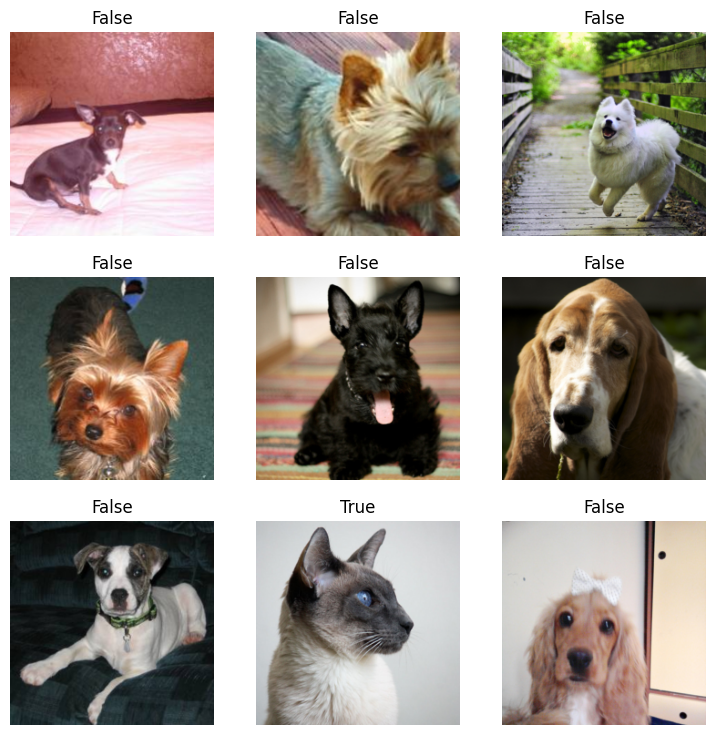

In [ ]:
# Yüklənmiş şəkillərin bir batch (qrup) nümunəsini vizual olaraq göstərir.
dls.show_batch()

### Creat Model

In [ ]:
# Konvolyusiyalı sinir şəbəkəsi (CNN) modelini yaratmaq üçün `cnn_learner` funksiyasını çağırır.
learn = cnn_learner(
    # Təlim üçün hazırlanan və yüklənmiş verilənlər bazasını göstərir.
    dls,
    # Modelin əsasını təşkil edən əvvəlcədən təlimli `resnet34` arxitekturasını istifadə edir.
    resnet34,
    # Modelin performansını izləmək üçün istifadə ediləcək qiymətləndirmə metriklərini təyin edir.
    metrics=[error_rate, accuracy]
)

# Modelin qatlarını və hər qatın təfərrüatlarını ətraflı şəkildə göstərir.
learn.summary()

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")


Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     64 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

### Train Stage

In [ ]:
# Əvvəlcədən təlimli `resnet34` modelini yüklənmiş verilənlər bazasında 5 epox (dövriyyə) üçün yenidən təlim etdirir.
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.178464,0.027559,0.009472,0.990528,00:55


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.045892,0.013645,0.006089,0.993911,01:01
1,0.040308,0.026113,0.009472,0.990528,01:00
2,0.025825,0.037515,0.009472,0.990528,00:57
3,0.014209,0.010418,0.004060,0.995940,01:00
4,0.010916,0.008369,0.004060,0.995940,00:58


### Show results

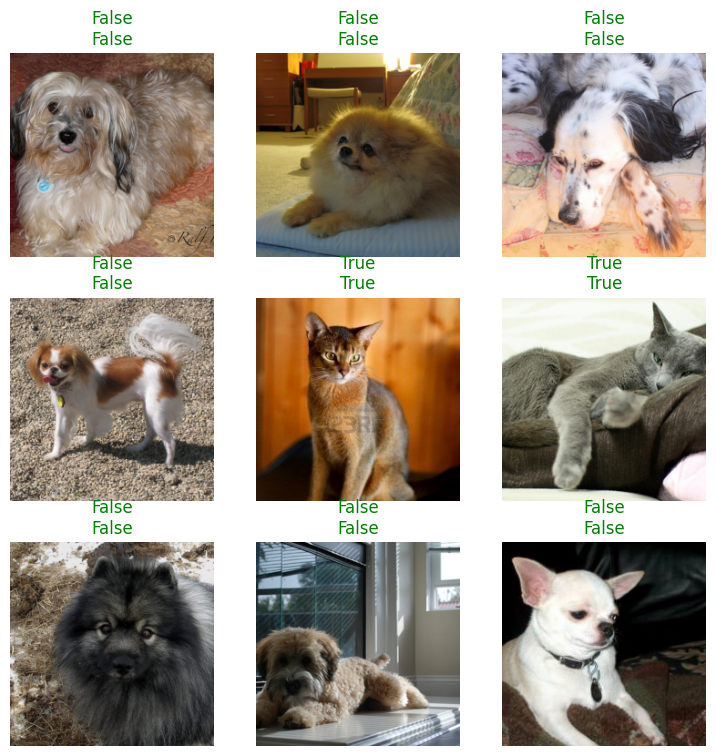

In [ ]:
# Modelin təlimi başa çatdıqdan sonra verilənlər üzərindəki nəticələri vizual şəkildə göstərir.
# Hər bir şəkil ilə yanaşı, modelin etdiyi proqnoz və əsl etiketin müqayisəsini göstərir.
learn.show_results()

### Modelin ən çox səhv etdiyi 15 nümunəni vizual olaraq göstərir.

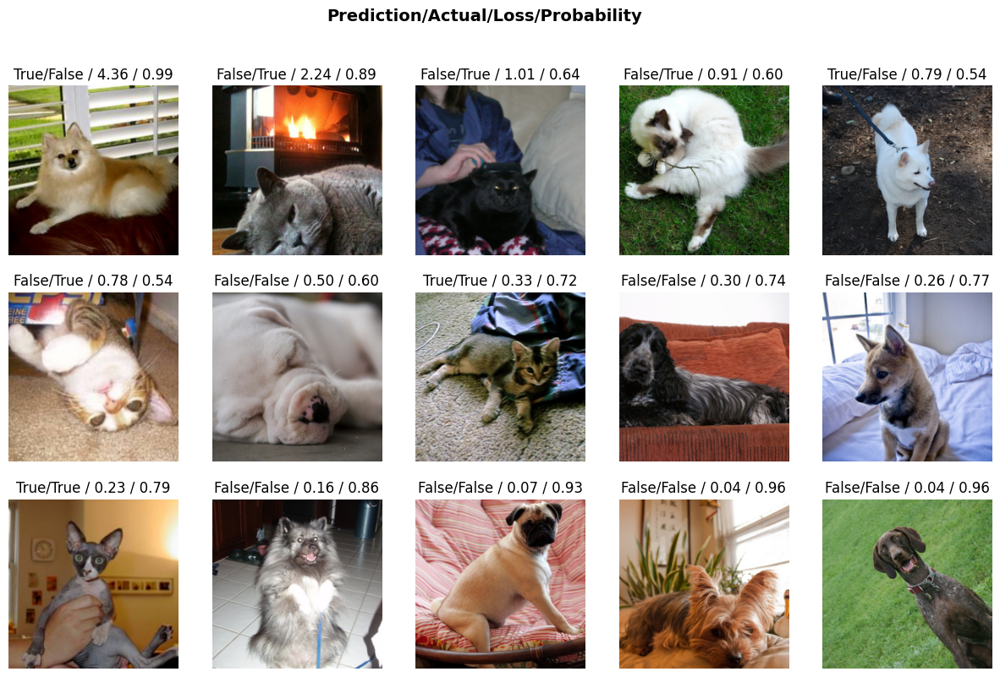

In [ ]:
# Modelin təlim nəticələrini əsaslanaraq `Interpretation` obyektini yaradır.
# Bu obyekt modelin proqnozlarını və səhvlərini təhlil etməyə kömək edir.
interp = Interpretation.from_learner(learn)

# Modelin ən çox səhv etdiyi 15 nümunəni vizual olaraq göstərir.
# `k=15` göstəriləcək ən çox səhv edilən nümunələrin sayını təyin edir.
interp.plot_top_losses(k=15)


### Test Stage and Metrics

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

# 1. Validation datası üzərində proqnozları almaq
# Bu, `get_preds` funksiyası ilə olur və həm proqnozları (preds), həm də əsl etiketləri (targets) alır
preds, targets = learn.get_preds(dl=dls.valid)

# 2. Proqnozları ən ehtimal olunan sinfə çevirmək
# Bu ehtimalların ən yüksək dəyərinə uyğun olan sinfi alırıq
pred_labels = preds.argmax(dim=1)

# 3. Metrikləri hesablamaq
accuracy = accuracy_score(targets, pred_labels)
f1 = f1_score(targets, pred_labels, average='weighted')
recall = recall_score(targets, pred_labels, average='weighted')
precision = precision_score(targets, pred_labels, average='weighted')
conf_matrix = confusion_matrix(targets, pred_labels)
class_report = classification_report(targets, pred_labels)

# 4. Nəticələri çap etmək
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Accuracy: 0.9959
F1 Score: 0.9959
Recall: 0.9959
Precision: 0.9959
Confusion Matrix:
[[1016    2]
 [   4  456]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1018
           1       1.00      0.99      0.99       460

    accuracy                           1.00      1478
   macro avg       1.00      0.99      1.00      1478
weighted avg       1.00      1.00      1.00      1478



### Forecast

In [ ]:
# Yeni görüntü üzərində proqnoz etmək istəyirsinizsə:
img = PILImage.create(path/"images"/"Abyssinian_1.jpg")  # Burada başqa bir test görüntüsü göstərə bilərsiniz
pred, pred_idx, probs = learn.predict(img)

# Nəticəni çap edin
print(f"Predicted: {pred}, Probability: {probs[pred_idx]:.4f}")

Predicted: True, Probability: 1.0000


### Check Forecast

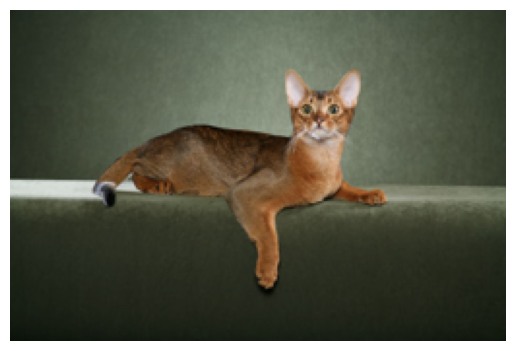

In [ ]:
import matplotlib.pyplot as plt
from fastai.vision.all import *

# 1. Şəkli yükləyin
img_path = path/"images"/"Abyssinian_1.jpg"
img = PILImage.create(img_path)

# 2. Şəkli göstərmək üçün `matplotlib` ilə plot etmək
plt.imshow(img.to_thumb(256,256))  # Şəkli 256x256 ölçüsündə göstərin
plt.axis('off')  # Oxa (axis) göstərməyin
plt.show()

### Real Forecast

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving download (2).jpg to download (2).jpg


In [ ]:
# Yeni görüntü üzərində proqnoz etmək istəyirsinizsə:
img = PILImage.create("download (2).jpg")  # Burada başqa bir test görüntüsü göstərə bilərsiniz
pred, pred_idx, probs = learn.predict(img)

# Nəticəni çap edin
print(f"Predicted: {pred}, Probability: {probs[pred_idx]:.4f}")

Predicted: True, Probability: 1.0000


### Check Forecast

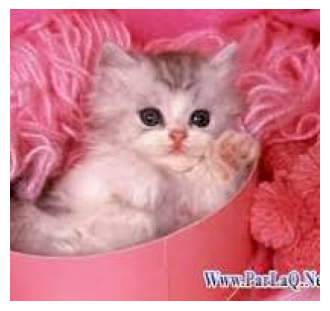

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Şəkili açın və göstərmək üçün plt.imshow funksiyasına verin
image_path = r"download (2).jpg"
image = Image.open(image_path)

plt.figure(figsize=(4,4))
plt.imshow(image)
plt.axis("off")  # Oxları gizlətmək üçün
plt.show()

## Classifying breeds

In [ ]:
from fastai.vision.all import *

### Data yuklneir

In [ ]:
# Ev heyvanları verilənlər bazasını internetdən yükləyir və çıxarır, saxlanılan qovluğun yolunu
                                                                                    # `path` dəyişənində saxlayır
path = untar_data(URLs.PETS)

In [ ]:
path.ls()

(#2) [Path('/root/.fastai/data/oxford-iiit-pet/annotations'),Path('/root/.fastai/data/oxford-iiit-pet/images')]

In [ ]:
# `path` qovluğundakı "images" adlı alt qovluqda olan bütün şəkil fayllarını tapır və onları 'files' adlı siyahıda saxlayır.
files = get_image_files(path/"images")

# Fayl siyahısındakı (images qovluğunda olan şəkillərin) ümumi sayını göstərir.
len(files)

7390

In [ ]:
files[0].name

'pomeranian_57.jpg'

### Data Preparation

In [ ]:
# Fayl adından yalnız şəkil adı (ad və ya başlıq) hissəsini çıxarmaq üçün `regex` ifadəsi.
# Bu ifadə fayl adının əvvəlki hissəsini seçir (məsələn, `Cat_123.jpg` üçün `Cat`),
# sonundakı rəqəmləri və `.jpg` uzantısını istisna edir.
pat = r'^(.*)_\d+.jpg'

In [ ]:
from fastai.data.block import RandomSplitter

# Şəkil məlumatlarını yükləmək və etiketləri `regex` ilə çıxarmaq üçün `ImageDataLoaders.from_name_re` funksiyasını istifadə edir.
# Verilənləri train və test dəstlərinə təsadüfi ayırmaq üçün `RandomSplitter` istifadə edirik.
dls = ImageDataLoaders.from_name_re(
    path,                     # Şəkil fayllarının saxlandığı əsas qovluq yolu
    files,                     # Şəkil fayllarının siyahısı
    pat,                       # `regex` ifadəsi ilə etiketləri çıxarır
    item_tfms=Resize(224),     # Şəkilləri 224x224 ölçüsünə endirir
    splitter=RandomSplitter(valid_pct=0.2, seed=42)  # Verilənləri təlim və testə ayırır (80%-20% nisbəti ilə)
)

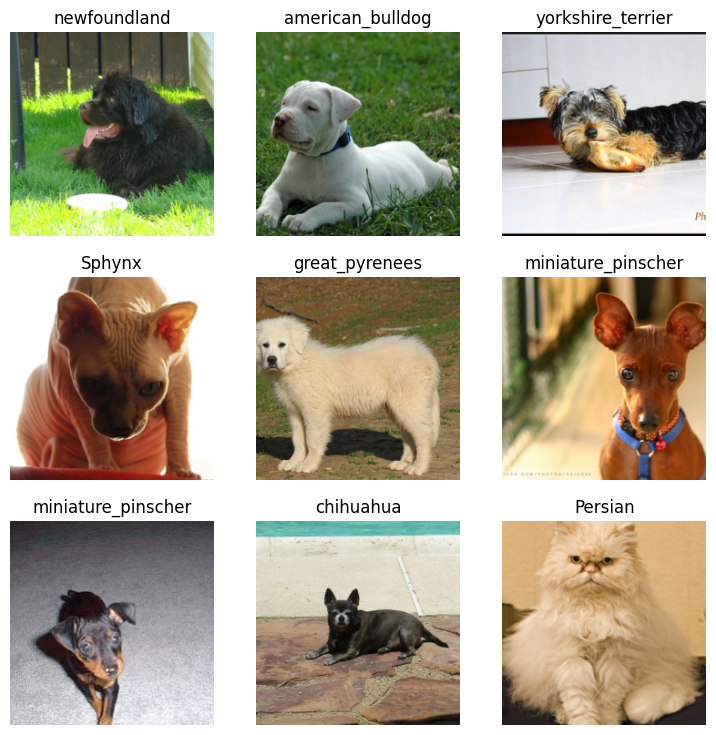

In [ ]:
# `dls.show_batch()` verilənlər dəstindən (dataloader) təsadüfi bir batch (partiya) göstərir.
# Bu funksiya verilən şəkillərin bir neçə nümunəsini və bu nümunələrə uyğun olan etiketləri ekranda vizuallaşdırır.
# Bu, təlim və ya test dəstlərindən təsadüfi şəkil nümunələrinin və onların etiketlərinin necə göründüyünü yoxlamağa kömək edir.
dls.show_batch()

### 37 müxtəlif cins arasında pişik və ya itlərin dəqiq cinsini təsnif etmək daha çətin problem olduğundan, məlumatların artırılmasından istifadə etmək üçün DataLoaderlərimizin tərifini bir qədər dəyişəcəyik.

In [ ]:
# Şəkil məlumatlarını yükləmək və etiketləri `regex` ilə çıxarmaq üçün `ImageDataLoaders.from_name_re` funksiyasını istifadə edir.
# `item_tfms` və `batch_tfms` ilə şəkil üzərində ön hazırlıq və artırma əməliyyatları edilir.
dls = ImageDataLoaders.from_name_re(
    path,                       # Şəkil fayllarının saxlandığı əsas qovluğun yolu
    files,                       # Şəkil fayllarının siyahısı
    pat,                         # Fayl adlarından etiketləri çıxarmaq üçün `regex` (regular expression) ifadəsi
    item_tfms=Resize(460),       # Şəkilləri ilkin olaraq 460x460 ölçüsünə endirir (çünki `item_tfms` hər bir şəkil üçün tətbiq olunur)
    batch_tfms=aug_transforms(size=224),  # Şəkilləri daha sonra 224x224 ölçüsünə endirir və təsadüfi artırma (augmentation) tətbiq edir
    splitter=RandomSplitter(valid_pct=0.2, seed=42)  # Verilənləri təlim və testə ayırır (80%-20% nisbəti ilə)
)

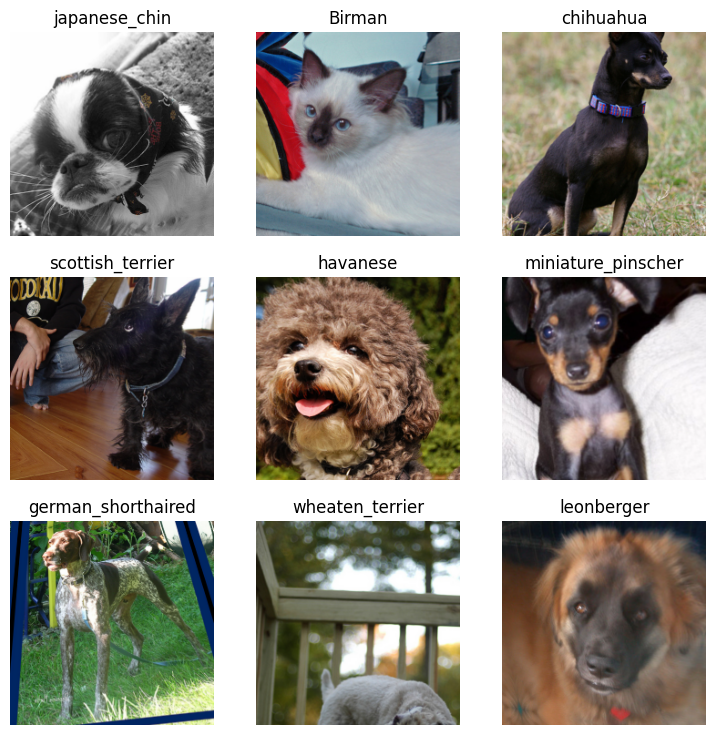

In [ ]:
# `dls.show_batch()` verilənlər dəstinin bir batch (partiya) hissəsini vizuallaşdırır.
# Bu metod, verilənlər dəstindən təsadüfi olaraq bir neçə şəkli və onların uyğun etiketlərini ekranda göstərir.
# Şəkillərin düzgün yükləndiyini və etiketlərin doğru şəkildə tətbiq edildiyini yoxlamağa kömək edir.
# Bu vizuallaşdırma təlim və test dəstlərindən seçilmiş şəkil nümunələrinin və onların etiketlərinin necə göründüyünü göstərir.
dls.show_batch()

### Creat Model

In [ ]:
# `cnn_learner` funksiyası, verilənlər dəstini (`dls`) və modelin arxitekturasını (`resnet34`) təyin edərək bir konvolyusiya sinir
                                                                                                              # şəbəkəsi (CNN) modeli qurur.
# Burada `resnet34` modelinin əvvəlcədən təlimlənmiş çəki faylları istifadə edilir.
# `metrics` parametri isə modelin qiymətləndirilməsi üçün istifadə edilən metrikləri müəyyən edir. Burada `error_rate` və `accuracy` seçilmişdir.
# - `error_rate`: Modelin səhv (yanlış) təsnifat nisbətini ölçür.
# - `accuracy`: Modelin doğru təsnifat etmə nisbətini ölçür.
learn = cnn_learner(
    dls,                        # Şəkil məlumatlarını yükləyən DataLoader obyektini təyin edir
    resnet34,                   # ResNet34 modelini istifadə edir
    metrics=[error_rate, accuracy]  # Modelin qiymətləndirilməsi üçün səhv nisbəti və doğruluq metriklərini təyin edir
)


# Modelin qatlarını və hər qatın təfərrüatlarını ətraflı şəkildə göstərir.
learn.summary()

/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 123MB/s]


Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     64 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
ReLU                      

### Train Stage

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

SuggestedLRs(valley=0.0014454397605732083)

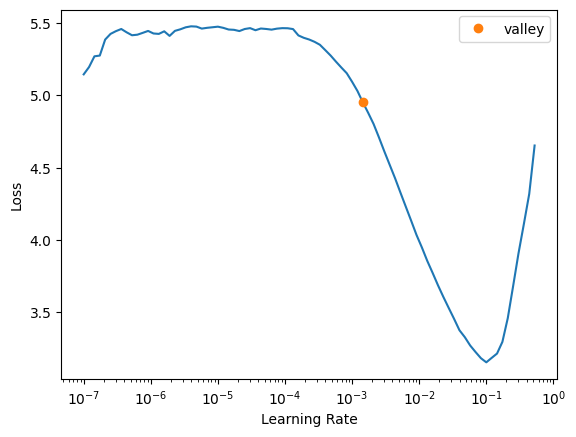

In [ ]:
# Learning Rate Finder ilə optimal learning rate tapmaq
learn.lr_find()

# Qrafikə baxın və ən yaxşı learning rate dəyərini tapın
# Bu qrafikdə, ən sürətli itki azalmasının olduğu nöqtə ən yaxşı learning rate olacaq

In [ ]:
# One-Cycle Training Policy ilə modelin təlimini başlamaq (5 epoch ilə)
learn.fit_one_cycle(2, lr_max=1e-3)  # 1e-3 optimal learning rate kimi təyin edilir

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.606431,0.284301,0.094723,0.905277,43:39
1,0.445006,0.240830,0.079838,0.920162,42:35


### Show Results

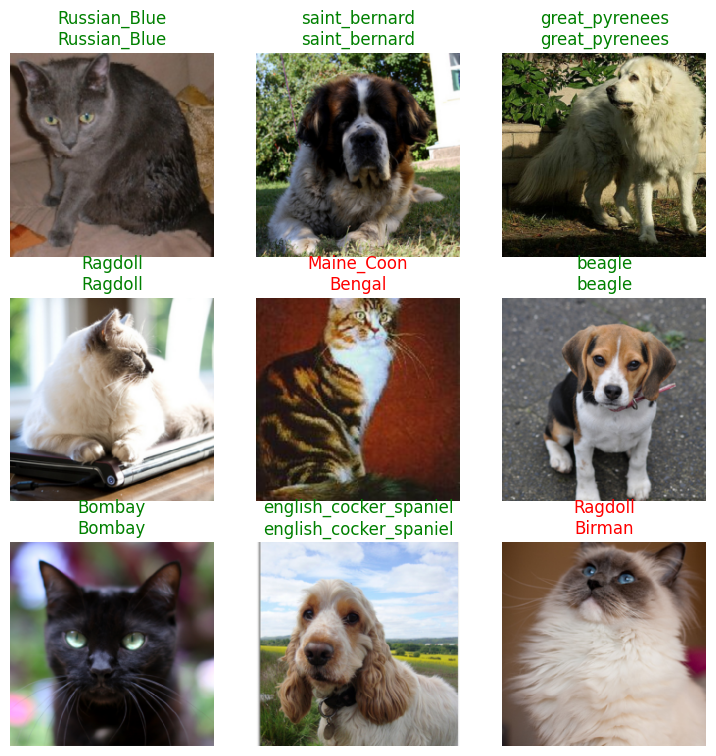

In [ ]:
learn.show_results()

### Interpretation

In [ ]:
# Modeldən təlim məlumatları əsasında təsvirləri analiz etmək üçün `Interpretation` obyektini yaratmaq.
interp = Interpretation.from_learner(learn)

# Modelin klassifikasiyası ilə bağlı səhvləri, proqnozları və doğruluqları daha ətraflı analiz etmək
                                                                    # üçün `ClassificationInterpretation` obyektini yaratmaq.
interp2 = ClassificationInterpretation.from_learner(learn)

### Predict Matrix

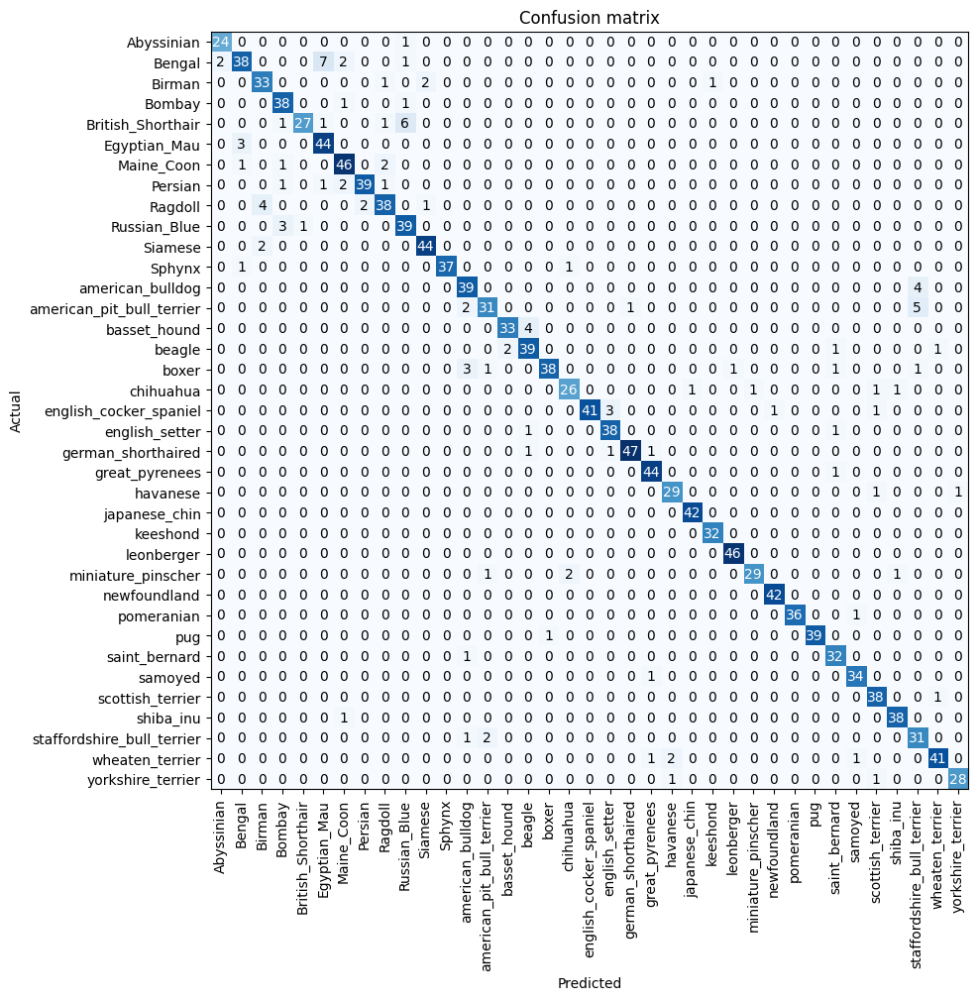

In [ ]:
# Klassifikasiya nəticələrini vizuallaşdırmaq üçün qarışıqlıq matrisini (confusion matrix) göstərir.
# Bu matrisdə modelin hansı sinifləri düzgün və hansı sinifləri səhv təsnif etdiyini görə bilərsiniz.
interp2.plot_confusion_matrix(figsize=(15,10))

### top_losses predict Plot

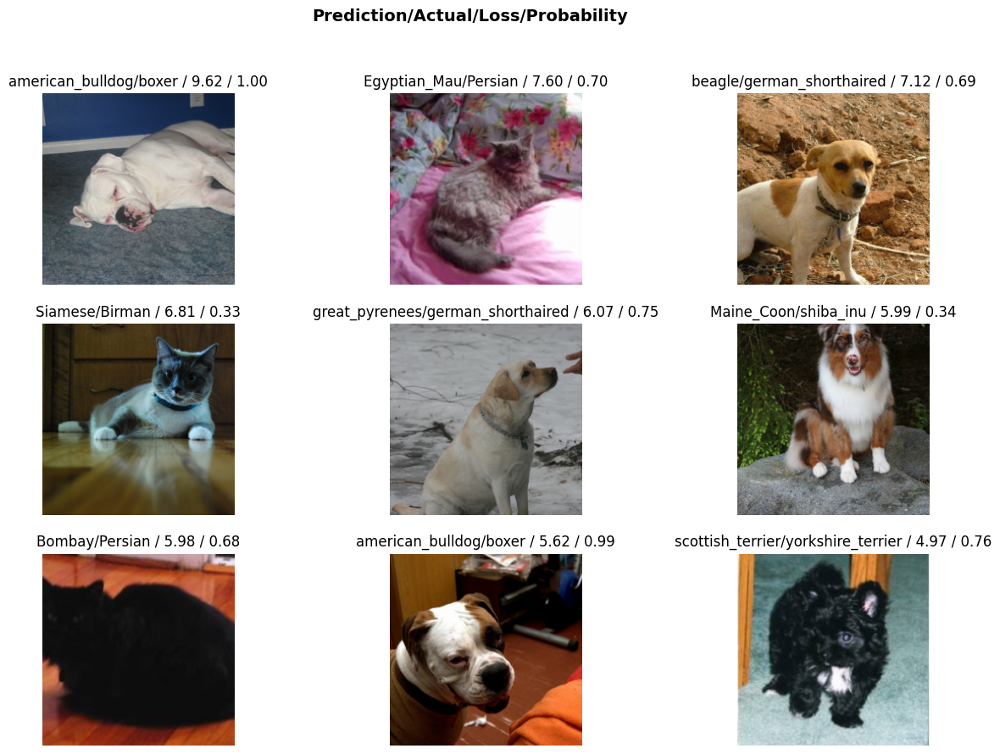

In [ ]:
# Ən yüksək itkiyə səbəb olan 9 nümunəni (yəni modelin ən çox səhv etdiyi və ya ən çox çətinlik çəkdiyi nümunələri) göstərir.
# Bu nümunələri vizual şəkildə görmək, modelin harada çətinlik çəkdiyini başa düşməyə kömək edə bilər.
interp.plot_top_losses(9, figsize=(15,10))

### Test Stage and Metrics

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

# 1. Validation datası üzərində proqnozları almaq
# Bu, `get_preds` funksiyası ilə olur və həm proqnozları (preds), həm də əsl etiketləri (targets) alır
preds, targets = learn.get_preds(dl=dls.valid)

# 2. Proqnozları ən ehtimal olunan sinfə çevirmək
# Bu ehtimalların ən yüksək dəyərinə uyğun olan sinfi alırıq
pred_labels = preds.argmax(dim=1)

# 3. Metrikləri hesablamaq
accuracy = accuracy_score(targets, pred_labels)
f1 = f1_score(targets, pred_labels, average='weighted')
recall = recall_score(targets, pred_labels, average='weighted')
precision = precision_score(targets, pred_labels, average='weighted')
conf_matrix = confusion_matrix(targets, pred_labels)
class_report = classification_report(targets, pred_labels)

# 4. Nəticələri çap etmək
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Accuracy: 0.9202
F1 Score: 0.9200
Recall: 0.9202
Precision: 0.9231
Confusion Matrix:
[[24  0  0 ...  0  0  0]
 [ 2 38  0 ...  0  0  0]
 [ 0  0 33 ...  0  0  0]
 ...
 [ 0  0  0 ... 31  0  0]
 [ 0  0  0 ...  0 41  0]
 [ 0  0  0 ...  0  0 28]]

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94        25
           1       0.88      0.76      0.82        50
           2       0.85      0.89      0.87        37
           3       0.86      0.95      0.90        40
           4       0.96      0.75      0.84        36
           5       0.83      0.94      0.88        47
           6       0.88      0.92      0.90        50
           7       0.95      0.89      0.92        44
           8       0.88      0.84      0.86        45
           9       0.81      0.91      0.86        43
          10       0.94      0.96      0.95        46
          11       1.00      0.95      0.97        39
          12       0.85      0.9

### Forecast

In [ ]:
from fastai.vision.all import PILImage

# Şəkili `PILImage` kimi yükləyin
img_path = path/"images"/"Abyssinian_1.jpg"  # Şəkil yolunu dəqiq göstərmək lazımdır
img = PILImage.create(img_path)  # `PILImage.create` ilə şəkili yükləyərək Fastai-nin gözlədiyi formata çeviririk

# Proqnoz almaq
pred_class, pred_idx, outputs = learn.predict(img)

# Nəticəni çap etmək
print(f"Proqnozlaşdırılan sinif: {pred_class}")
print(f"Sinif indeks nömrəsi: {pred_idx}")
print(f"Ehtimallar: {outputs}")

Proqnozlaşdırılan sinif: Abyssinian
Sinif indeks nömrəsi: 0
Ehtimallar: tensor([9.9663e-01, 1.1455e-03, 1.8932e-06, 2.5029e-06, 1.3852e-04, 1.1933e-04,
        3.5594e-05, 4.3152e-06, 3.0448e-06, 3.1003e-04, 2.0858e-04, 1.0203e-04,
        2.4956e-07, 1.5462e-06, 1.8900e-05, 1.8127e-05, 1.1049e-05, 1.0431e-03,
        1.1425e-06, 3.9061e-06, 6.5868e-06, 1.8083e-06, 7.3756e-07, 1.0876e-06,
        9.7072e-07, 1.4747e-06, 5.6844e-05, 4.9518e-07, 1.0974e-05, 5.4375e-07,
        1.0155e-05, 9.6593e-07, 1.5192e-06, 7.6736e-05, 3.8563e-07, 2.4203e-05,
        2.3022e-06])


### Check Forecast

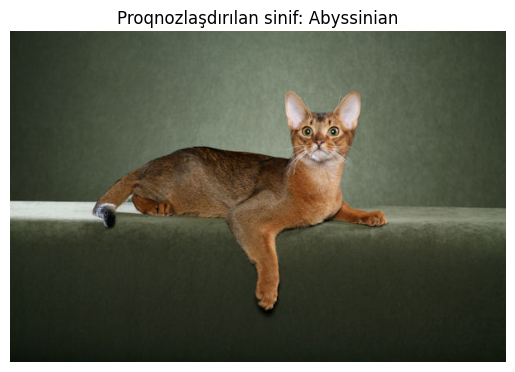

In [ ]:
import matplotlib.pyplot as plt
from fastai.vision.all import PILImage

# Şəkili yükləyin və `PILImage` kimi oxuyun
img_path = path/"images"/"Abyssinian_1.jpg"
img = PILImage.create(img_path)

# Proqnozlaşdırma
pred_class, pred_idx, outputs = learn.predict(img)

# Şəkili və proqnozu vizuallaşdırın
plt.imshow(img)
plt.title(f"Proqnozlaşdırılan sinif: {pred_class}")
plt.axis("off")  # Oks koordinatlarını gizlədir
plt.show()

### Real Forecast

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving download (2).jpg to download (2).jpg


In [ ]:
from fastai.vision.all import PILImage

# Şəkili `PILImage` kimi yükləyin
img_path = "download (2).jpg"  # Şəkil yolunu dəqiq göstərmək lazımdır
img = PILImage.create(img_path)  # `PILImage.create` ilə şəkili yükləyərək Fastai-nin gözlədiyi formata çeviririk

# Proqnoz almaq
pred_class, pred_idx, outputs = learn.predict(img)

# Nəticəni çap etmək
print(f"Proqnozlaşdırılan sinif: {pred_class}")
print(f"Sinif indeks nömrəsi: {pred_idx}")
print(f"Ehtimallar: {outputs}")

Proqnozlaşdırılan sinif: Persian
Sinif indeks nömrəsi: 7
Ehtimallar: tensor([4.6994e-05, 2.1565e-05, 8.0576e-04, 9.2296e-06, 1.2750e-04, 7.9557e-06,
        2.1049e-03, 9.4073e-01, 4.4908e-02, 3.2824e-06, 3.4463e-07, 3.0700e-05,
        3.5049e-06, 4.7190e-06, 3.4097e-07, 4.3359e-06, 2.3539e-06, 1.4684e-06,
        1.2864e-05, 3.6275e-06, 2.5605e-06, 1.8154e-05, 1.1624e-04, 1.8767e-04,
        5.5086e-05, 6.4814e-07, 5.5998e-06, 6.4284e-07, 1.0655e-02, 6.9523e-06,
        1.9417e-06, 2.4667e-05, 2.9922e-05, 3.9754e-06, 8.8853e-08, 1.9249e-06,
        6.2147e-05])


### Check Forecast

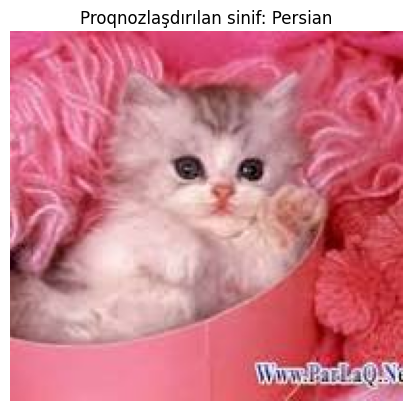

In [ ]:
import matplotlib.pyplot as plt
from fastai.vision.all import PILImage

# Şəkili yükləyin və `PILImage` kimi oxuyun
img_path = "download (2).jpg"
img = PILImage.create(img_path)

# Proqnozlaşdırma
pred_class, pred_idx, outputs = learn.predict(img)

# Şəkili və proqnozu vizuallaşdırın
plt.imshow(img)
plt.title(f"Proqnozlaşdırılan sinif: {pred_class}")
plt.axis("off")  # Oks koordinatlarını gizlədir
plt.show()

## Multi-label classification

In [ ]:
from fastai.vision.all import *

### Data yuklenir

In [ ]:
# Fastai kitabxanasında Pascal VOC 2007 datasetini yükləyir və açır. Yüklənmiş fayllar `path` dəyişənində saxlanılır.
path = untar_data(URLs.PASCAL_2007)

# Yüklənmiş qovluqdakı əsas fayl və qovluqları göstərir.
path.ls()

(#8) [Path('/root/.fastai/data/pascal_2007/train.csv'),Path('/root/.fastai/data/pascal_2007/valid.json'),Path('/root/.fastai/data/pascal_2007/test.json'),Path('/root/.fastai/data/pascal_2007/test'),Path('/root/.fastai/data/pascal_2007/segmentation'),Path('/root/.fastai/data/pascal_2007/test.csv'),Path('/root/.fastai/data/pascal_2007/train'),Path('/root/.fastai/data/pascal_2007/train.json')]

In [ ]:
df = pd.read_csv(path/'train.csv')
df.head()

,fname,labels,is_valid
0,000005.jpg,chair,True
1,000007.jpg,car,True
2,000009.jpg,horse person,True
3,000012.jpg,car,False
4,000016.jpg,bicycle,True


### Data Preparation

In [ ]:
from fastai.vision.all import *

# Şəkillər və etiketləri ehtiva edən DataFrame olan `df` və əsas yol olan `path` müəyyən edilir.
# `df` DataFrame-də `is_valid` sütunu olmasa belə, splitter parametri ilə train və validation üçün təsadüfi bölünmə edilə bilər.

# Şəkil məlumatları üçün DataLoader obyektini yaratmaq
dls = ImageDataLoaders.from_df(
    df,                          # Şəkil yollarını və etiketləri saxlayan DataFrame.
    path,                        # Əsas qovluq yolu: bütün fayl yollarının əsasını təşkil edir.
    folder='train',              # Şəkillərin saxlandığı qovluq: əsas qovluğun içində `train` qovluğundan faylları yükləyir.
    valid_col='is_valid',        # Validation sütunu: `is_valid` sütunu validation setini təyin etmək üçün istifadə olunur.
    label_delim=' ',             # Bir şəkilin bir neçə etiketi varsa, onların arasında boşluq ilə ayrılması üçün istifadə olunur.
    item_tfms=Resize(460),       # Şəkil ölçüsü dəyişmə: hər bir şəkili 460x460 ölçüsünə uyğunlaşdırır.
    batch_tfms=aug_transforms(size=224),  # Batch transformasiyalar: təsadüfi artırma və şəkilləri 224x224 ölçüsünə uyğunlaşdırır.
    splitter=RandomSplitter(valid_pct=0.2, seed=42)  # Verilənləri 80%-20% nisbətində train və validation-a ayırır.
)

# `dls.train` və `dls.valid` DataLoader-ları ilə train və validation dəstlərini əldə etmək mümkündür.
# Məsələn:
train_dl = dls.train  # Train setinə məxsus DataLoader
valid_dl = dls.valid  # Validation setinə məxsus DataLoader

/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)


### One batch show

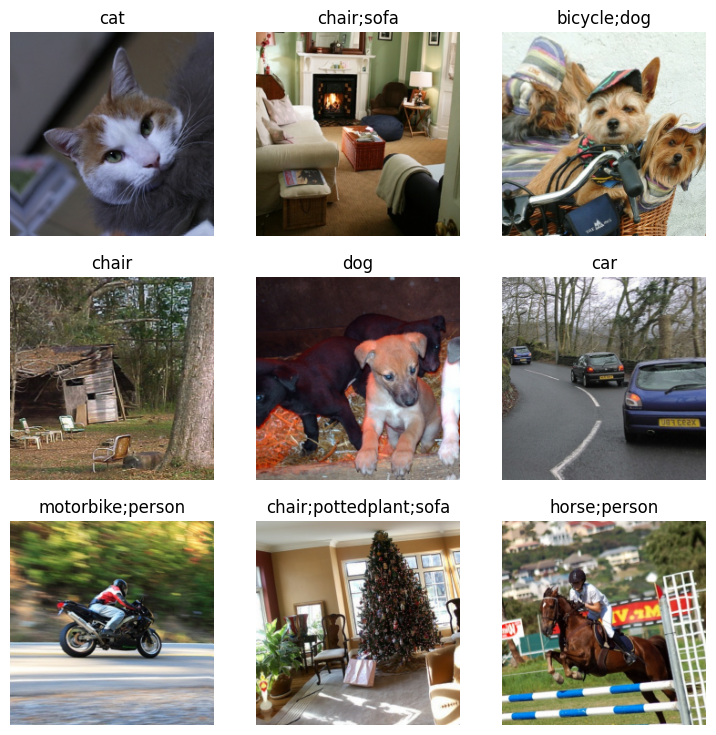

In [ ]:
# `show_batch` metodu, `dls` (DataLoaders obyekti) üzərində bir batch (toplu) şəkil və etiketləri vizual şəkildə göstərir.
# Bu metod, verilənlərin düzgün yüklənib-yüklənmədiyini yoxlamaq və artırma (augmentation) əməliyyatlarının təsirini
                                                                                        # görmək üçün istifadə olunur.
# Məsələn, hər bir şəkil üzərində təsadüfi dönmə, miqyaslandırma, əyilmə və s. kimi dəyişikliklərin təsirini vizual şəkildə
                                                                                        # müşahidə etmək üçün faydalıdır.
dls.show_batch()


### Creat Model

In [ ]:
# `cnn_learner` funksiyası bir konvolyusiya sinir şəbəkəsi (CNN) modeli yaradır və öyrənmə prosesinə başlamaq üçün tələb
                                                                                                # olunan parametrləri təyin edir.
learn = cnn_learner(
    dls,                           # `dls` (DataLoaders obyekti), train və validation verilənlərini saxlayan obyekt.
    resnet50,                      # `resnet50` modeli əvvəlcədən təlimləndirilib və təyin olunan arxitektura olaraq istifadə olunur.
    metrics=partial(accuracy_multi, thresh=0.5)  # `metrics` parametri modelin qiymətləndirmə metrikini təyin edir:
                                                # burada `accuracy_multi`, çoxlu siniflərin doğruluğunu ölçən metrikdir,
                                                # `thresh=0.5` isə 0.5 ehtimal dəyərini məcburi doğru/qəbul olunmuş sinif sərhədi
                                                                                                # kimi qəbul edir.
)
learn.summary()

Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 64 x 112 x 112 
Conv2d                                    9408       False     
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     64 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    4096       False     
BatchNorm2d                               128        True      
Conv2d                                    36864      False     
BatchNorm2d                               128        True      
____________________________________________________________________________
                     64 x 256 x 56 x 56  
Conv2d                                    16384      False     
BatchNorm2d                        

### Train Stage

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

SuggestedLRs(valley=0.0014454397605732083)

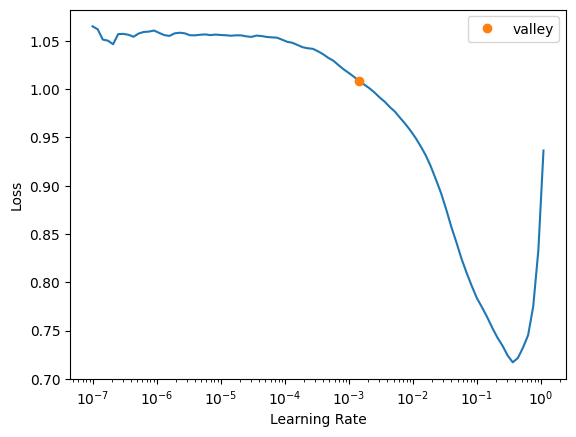

In [ ]:
# Learning Rate Finder ilə optimal learning rate tapmaq
learn.lr_find()

# Qrafikə baxın və ən yaxşı learning rate dəyərini tapın
# Bu qrafikdə, ən sürətli itki azalmasının olduğu nöqtə ən yaxşı learning rate olacaq

In [ ]:
# One-Cycle Training Policy ilə modelin təlimini başlamaq (5 epoch ilə)
learn.fit_one_cycle(5, lr_max=1e-3)  # 1e-3 optimal learning rate kimi təyin edilir

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.647298,0.471432,0.817012,00:47
1,0.537991,0.291162,0.938008,00:48
2,0.394476,0.173569,0.968207,00:48
3,0.288848,0.137231,0.972968,00:47
4,0.233021,0.133469,0.972928,00:47


### Show Results

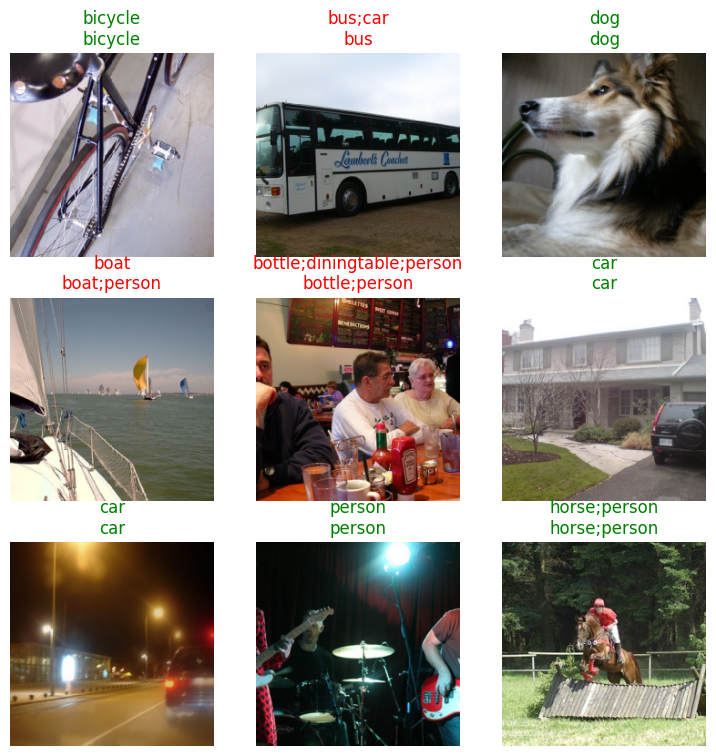

In [ ]:
learn.show_results()

### Test Stage and Metrics

In [ ]:
# Proqnozları və hədəfləri əldə et
preds, targets = learn.get_preds(dl=dls.valid)

# Proqnozları binar hala gətir (threshold istifadə edərək)
threshold = 0.5
binary_preds = (preds > threshold).int()

/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)
/usr/local/lib/python3.10/dist-packages/fastai/data/transforms.py:214: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  o = r[c] if isinstance(c, int) or not c in getattr(r, '_fields', []) else getattr(r, c)


In [ ]:
from sklearn.metrics import multilabel_confusion_matrix

# Hər bir sinif üçün confusion matrix
conf_matrices = multilabel_confusion_matrix(targets.numpy(), binary_preds.numpy())

# Hər bir sinif üçün confusion matrix çap etmək
for i, cm in enumerate(conf_matrices):
    print(f"Class {i} Confusion Matrix:")
    print(cm)

Class 0 Confusion Matrix:
[[2377    6]
 [  10  117]]
Class 1 Confusion Matrix:
[[2369    8]
 [  28  105]]
Class 2 Confusion Matrix:
[[2342   17]
 [  12  139]]
Class 3 Confusion Matrix:
[[2397   12]
 [  14   87]]
Class 4 Confusion Matrix:
[[2353   48]
 [  40   69]]
Class 5 Confusion Matrix:
[[2401   12]
 [  27   70]]
Class 6 Confusion Matrix:
[[2093   58]
 [  55  304]]
Class 7 Confusion Matrix:
[[2309   23]
 [  12  166]]
Class 8 Confusion Matrix:
[[2137   83]
 [ 106  184]]
Class 9 Confusion Matrix:
[[2426    9]
 [  28   47]]
Class 10 Confusion Matrix:
[[2328   49]
 [  27  106]]
Class 11 Confusion Matrix:
[[2271   19]
 [  27  193]]
Class 12 Confusion Matrix:
[[2338   22]
 [  13  137]]
Class 13 Confusion Matrix:
[[2367   17]
 [  16  110]]
Class 14 Confusion Matrix:
[[1431   54]
 [ 190  835]]
Class 15 Confusion Matrix:
[[2352   38]
 [  59   61]]
Class 16 Confusion Matrix:
[[2459    3]
 [  14   34]]
Class 17 Confusion Matrix:
[[2261   65]
 [  61  123]]
Class 18 Confusion Matrix:
[[2369    6

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score,\
                                                                                                 confusion_matrix

# Əsas metriklər (binary_preds: proqnozlar, targets: əsl dəyərlər)
accuracy = accuracy_score(targets.numpy(), binary_preds.numpy())
f1 = f1_score(targets.numpy(), binary_preds.numpy(), average='macro')
precision = precision_score(targets.numpy(), binary_preds.numpy(), average='macro')
recall = recall_score(targets.numpy(), binary_preds.numpy(), average='macro')

# Classification report (detallı məlumat)
report = classification_report(targets.numpy(), binary_preds.numpy())

# Confusion matrix (qarışıqlıq matrisini hesabla)
conf_matrix = confusion_matrix(targets.numpy().argmax(axis=1), binary_preds.numpy().argmax(axis=1))

# Metriklərin göstərilməsi
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print("\nClassification Report:")
print(report)
print("\nConfusion Matrix:")
print(conf_matrix)

Accuracy: 0.6052
F1 Score: 0.8033
Precision: 0.8265
Recall: 0.7861

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.94       127
           1       0.93      0.79      0.85       133
           2       0.89      0.92      0.91       151
           3       0.88      0.86      0.87       101
           4       0.59      0.63      0.61       109
           5       0.85      0.72      0.78        97
           6       0.84      0.85      0.84       359
           7       0.88      0.93      0.90       178
           8       0.69      0.63      0.66       290
           9       0.84      0.63      0.72        75
          10       0.68      0.80      0.74       133
          11       0.91      0.88      0.89       220
          12       0.86      0.91      0.89       150
          13       0.87      0.87      0.87       126
          14       0.94      0.81      0.87      1025
          15       0.62      0.51      0.56 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Forecast

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving download (4).jpg to download (4).jpg


In [ ]:
from fastai.vision.all import PILImage

# Şəkili `PILImage` kimi yükləyin
img_path = "download (4).jpg"  # Şəkil yolunu dəqiq göstərmək lazımdır
img = PILImage.create(img_path)  # `PILImage.create` ilə şəkili yükləyərək Fastai-nin gözlədiyi formata çeviririk

# Proqnoz almaq
pred_class, pred_idx, outputs = learn.predict(img)

# Nəticəni çap etmək
print(f"Proqnozlaşdırılan sinif: {pred_class}")
print(f"Sinif indeks nömrəsi: {pred_idx}")
print(f"Ehtimallar: {outputs}")

Proqnozlaşdırılan sinif: ['car', 'horse', 'person']
Sinif indeks nömrəsi: tensor([False, False, False, False, False, False,  True, False, False, False,
        False, False,  True, False,  True, False, False, False, False, False])
Ehtimallar: tensor([0.0458, 0.0412, 0.0711, 0.1437, 0.4219, 0.0638, 0.9993, 0.1504, 0.1263,
        0.0664, 0.0955, 0.1375, 0.6056, 0.1706, 0.9820, 0.0555, 0.2096, 0.1543,
        0.0276, 0.0638])


In [ ]:
from fastai.vision.all import PILImage
import torch

# Şəkili `PILImage` kimi yükləyin
img_path = "download (4).jpg"  # Şəkil yolunu dəqiq göstərin
img = PILImage.create(img_path)

# Proqnoz almaq
outputs = learn.predict(img)[2]  # `outputs` ehtimalları (logits) qaytarır

# Ehtimalları sigmoid funksiyası ilə 0 və 1 arasında normallaşdır
probs = torch.sigmoid(outputs)

# Threshold tətbiq edərək sinifləri seç
threshold = 0.7  # Ehtimal üçün hədd dəyəri
pred_classes = [learn.dls.vocab[i] for i, p in enumerate(probs) if p > threshold]

# Nəticələri çap etmək
print(f"Proqnozlaşdırılan siniflər: {pred_classes}")
print(f"Ehtimallar: {probs.tolist()}")

Proqnozlaşdırılan siniflər: ['car', 'person']
Ehtimallar: [0.5114526748657227, 0.5102973580360413, 0.517760157585144, 0.5358680486679077, 0.6039384007453918, 0.5159482955932617, 0.7309257388114929, 0.5375279188156128, 0.5315401554107666, 0.5165858864784241, 0.5238692760467529, 0.5343313813209534, 0.6469293236732483, 0.542535126209259, 0.7275073528289795, 0.5138697624206543, 0.5522112250328064, 0.5384990572929382, 0.5068990588188171, 0.5159347653388977]


### Check Forecast

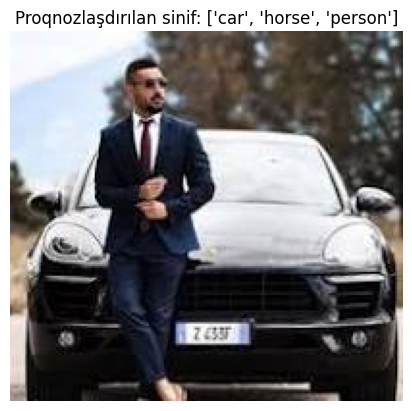

In [ ]:
import matplotlib.pyplot as plt
from fastai.vision.all import PILImage

# Şəkili yükləyin və `PILImage` kimi oxuyun
img_path = "download (4).jpg"
img = PILImage.create(img_path)

# Proqnozlaşdırma
pred_class, pred_idx, outputs = learn.predict(img)

# Şəkili və proqnozu vizuallaşdırın
plt.imshow(img)
plt.title(f"Proqnozlaşdırılan sinif: {pred_class}")
plt.axis("off")  # Oks koordinatlarını gizlədir
plt.show()